In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
%matplotlib inline

In [5]:
import tensorflow
print (tensorflow.__version__)

2.4.0


In [4]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!unzip /content/gdrive/MyDrive/GAN_datasets/selfie2cartoon.zip -d /

In [3]:
import glob
faces = glob.glob('/trainA/*.jpg')
cartoons = glob.glob("/trainB/*.jpg")
faces_test = glob.glob('/testA/*.jpg')
cartoons_test = glob.glob("/testB/*.jpg")

In [6]:
path = '/Users/k15/Downloads/cartoon/'

In [7]:
import glob
faces = glob.glob(path + '../selfie2anime/trainA/*.jpg')
cartoons = glob.glob(path + "/trainB/*.png")
faces_test = glob.glob(path + '../selfie2anime/testA/*.jpg')
cartoons_test = glob.glob(path + "/testB/*.png")

In [8]:
len(faces), len(cartoons), len(faces_test), len(cartoons_test)

(3400, 194, 100, 10)

In [9]:
import cv2
for file in faces[:10]:
    img = cv2.imread(file)
    print (img.shape)

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


Human Faces


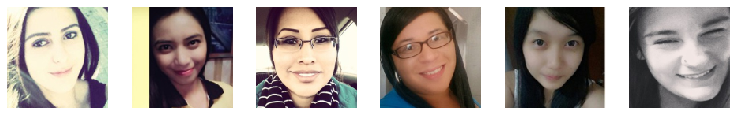

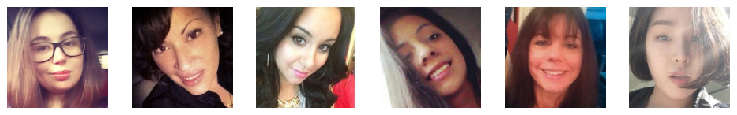

--------------------------------------------------------------------------------
cartoon Faces


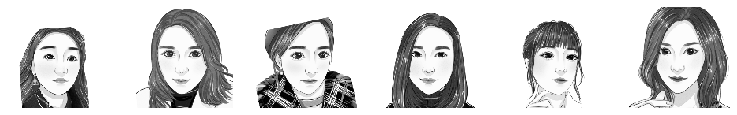

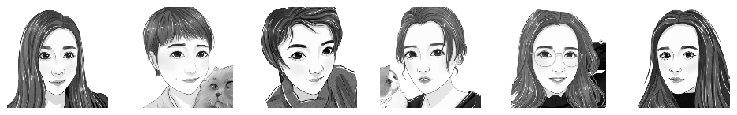

In [8]:
print ("Human Faces")
for k in range(2):
    plt.figure(figsize=(13, 13))
    for j in range(6):
        file = np.random.choice(faces)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (128,128))
        plt.subplot(660 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

print ("-"*80)
print ("cartoon Faces")
for k in range(2):
    plt.figure(figsize=(13, 13))
    for j in range(6):
        file = np.random.choice(cartoons)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.resize(img, (128,128))
        plt.subplot(660 + 1 + j)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

# Generator Model (U-Net Like)

In [9]:
import tensorflow_addons as tfa

In [31]:
def encoder_layer(input_layer, filters, bn=True):
    x = tensorflow.keras.layers.Conv2D(filters, kernel_size=(4,4), strides=(2,2), padding='same')(input_layer)
    x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
    if bn:
        #x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)
        x = tfa.layers.InstanceNormalization()(x)
    return x

def decoder_layer(input_layer, skip_input, filters):
    #x = tensorflow.keras.layers.UpSampling2D(size=2)(input_layer)
    x = tensorflow.keras.layers.Conv2DTranspose(filters, kernel_size=(4,4), strides=(2,2), padding='same')(input_layer)
    x = tensorflow.keras.layers.Activation('relu')(x)
    #x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tensorflow.keras.layers.Concatenate()([x, skip_input])
    return x

In [32]:
def make_generator():
    source_image = tensorflow.keras.layers.Input(shape=(128, 128, 3))
    target_style = tensorflow.keras.layers.Input(shape=(16, 16, 512))

    e1 = encoder_layer(source_image, 64, bn=False)
    e2 = encoder_layer(e1, 128)
    e3 = encoder_layer(e2, 256)
    # e4 = encoder_layer(e3, 256)
    e5 = encoder_layer(e3, 512)
    e6 = encoder_layer(e5, 512)
    e7 = encoder_layer(e6, 512)

    bottle_neck = tensorflow.keras.layers.Conv2D(512, (4,4), strides=(2,2), padding='same')(e7)
    b = tensorflow.keras.layers.Activation('relu')(bottle_neck)

    d1 = decoder_layer(b, e7, 512)
    d2 = decoder_layer(d1, e6, 512)
    d3 = decoder_layer(d2, e5, 512)
    # d4 = decoder_layer(d3, e4, 256)
    d5 = decoder_layer(d3, e3, 256)
    d5 = tensorflow.keras.layers.Concatenate()([d5, target_style])
    d6 = decoder_layer(d5, e2, 128)
    d7 = decoder_layer(d6, e1, 64)

    decoded = tensorflow.keras.layers.Conv2DTranspose(3, kernel_size=(4,4), strides=(2,2), padding='same')(d7)
    translated_image = tensorflow.keras.layers.Activation('tanh')(decoded)
    return source_image, target_style, translated_image

source_image, target_style, translated_image = make_generator()
generator_network = tensorflow.keras.models.Model(inputs=[source_image, target_style], outputs=translated_image)
print (generator_network.summary())

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d_17 (Conv2D)              (None, 64, 64, 64)   3136        input_11[0][0]                   
__________________________________________________________________________________________________
leaky_re_lu_14 (LeakyReLU)      (None, 64, 64, 64)   0           conv2d_17[0][0]                  
__________________________________________________________________________________________________
conv2d_18 (Conv2D)              (None, 32, 32, 128)  131200      leaky_re_lu_14[0][0]             
____________________________________________________________________________________________

# Discriminator Network

In [33]:
def my_conv_layer(input_layer, filters, bn=True):
    x = tensorflow.keras.layers.Conv2D(filters, kernel_size=(4,4), strides=(2,2), padding='same')(input_layer)
    x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
    if bn:
        #x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)
        x = tfa.layers.InstanceNormalization()(x)
    return x

In [34]:
 def make_discriminator():
    target_image_input = tensorflow.keras.layers.Input(shape=(128, 128, 3))

    x = my_conv_layer(target_image_input, 64, bn=False)
    x = my_conv_layer(x, 128)
    x = my_conv_layer(x, 256)
    # x = my_conv_layer(x, 512)
    x = my_conv_layer(x, 512)

    patch_features = tensorflow.keras.layers.Conv2D(1, kernel_size=(4,4), strides=(1,1), padding='same')(x)
    return target_image_input, patch_features


target_image_input, patch_features = make_discriminator()
discriminator_network = tensorflow.keras.models.Model(inputs=target_image_input, outputs=patch_features)

print (discriminator_network.summary())

Model: "model_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 128, 128, 3)]     0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 64, 64, 64)        3136      
_________________________________________________________________
leaky_re_lu_20 (LeakyReLU)   (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 32, 32, 128)       131200    
_________________________________________________________________
leaky_re_lu_21 (LeakyReLU)   (None, 32, 32, 128)       0         
_________________________________________________________________
instance_normalization_28 (I (None, 32, 32, 128)       256       
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 16, 16, 256)       5245

In [35]:
adam_optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_network.compile(loss='mse', optimizer=adam_optimizer, metrics=['accuracy'])

# VGG features

In [12]:
image_input = tensorflow.keras.layers.Input(shape=(128, 128, 3))

pre_trained_vgg = tensorflow.keras.applications.vgg19.VGG19(weights='imagenet', input_shape=(128, 128, 3), include_top=False)
pre_trained_vgg_model = tensorflow.keras.models.Model(inputs=pre_trained_vgg.input, outputs=pre_trained_vgg.get_layer('block4_conv4').output)

pre_trained_image_feautures = pre_trained_vgg_model(image_input)

custom_vgg = tensorflow.keras.models.Model(inputs=image_input, outputs=pre_trained_image_feautures)
print (custom_vgg.summary())

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
model (Functional)           (None, 16, 16, 512)       10585152  
Total params: 10,585,152
Trainable params: 10,585,152
Non-trainable params: 0
_________________________________________________________________
None


# Customized-Face2cartoon-GAN

In [37]:
source_image = tensorflow.keras.layers.Input(shape=(128, 128, 3))
target_features = tensorflow.keras.layers.Input(shape=(16, 16, 512))

# Domain Transfer
custom_vgg.trainable=False
fake_cartoon = generator_network([source_image, target_features])
  
discriminator_network.trainable=False

# Tell Real vs Fake
real_vs_fake = discriminator_network(fake_cartoon)

face2cartoon_gan = tensorflow.keras.models.Model(inputs =[source_image, target_features], outputs = [real_vs_fake, fake_cartoon, fake_cartoon])
face2cartoon_gan.summary()

Model: "model_12"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_16 (InputLayer)           [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
input_17 (InputLayer)           [(None, 16, 16, 512) 0                                            
__________________________________________________________________________________________________
model_8 (Functional)            (None, 128, 128, 3)  42882051    input_16[0][0]                   
                                                                 input_17[0][0]                   
__________________________________________________________________________________________________
model_9 (Functional)            (None, 8, 8, 1)      2766529     model_8[0][0]             

# Custom Content Loss (vgg features Loss)

In [38]:
def custom_content_loss(y_true, y_pred):
    custom_vgg.trainable=False
    y_true_features = custom_vgg(y_true)
    y_pred_features = custom_vgg(y_pred)
    content_loss = tensorflow.keras.losses.mean_absolute_error(y_true_features, y_pred_features)
    return content_loss

def custom_content_loss2(y_true, y_pred):
    custom_vgg.trainable=False
    y_true_features = y_true
    y_pred_features = custom_vgg(y_pred)
    content_loss = tensorflow.keras.losses.mean_absolute_error(y_true_features, y_pred_features)
    return content_loss

# Compiling Models

In [39]:
face2cartoon_gan.compile(loss=['mse', custom_content_loss, custom_content_loss],\
                       optimizer=adam_optimizer, loss_weights=[1, 1, 0.1])

# Define Data Generators

In [2]:
def faces_to_cartoons(faces, styles, generator_network):
    styles = custom_vgg(styles)
    generated_samples = generator_network.predict_on_batch([faces, styles])
    return generated_samples

def do_smoothing(img):
    # taken from https://github.com/penny4860/Keras-CartoonGan/blob/master/cartoon/utils.py
    kernel_size = 5
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    gauss = cv2.getGaussianKernel(kernel_size, 0)
    gauss = gauss * gauss.transpose(1, 0)

    rgb_img = img
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    pad_img = np.pad(rgb_img, ((2,2), (2,2), (0,0)), mode='reflect')
    edges = cv2.Canny(gray_img, 100, 200)
    dilation = cv2.dilate(edges, kernel)

    gauss_img = np.copy(rgb_img)
    idx = np.where(dilation != 0)
    for i in range(np.sum(dilation != 0)):
        gauss_img[idx[0][i], idx[1][i], 0] = np.sum(np.multiply(pad_img[idx[0][i]:idx[0][i] + kernel_size, idx[1][i]:idx[1][i] + kernel_size, 0], gauss))
        gauss_img[idx[0][i], idx[1][i], 1] = np.sum(np.multiply(pad_img[idx[0][i]:idx[0][i] + kernel_size, idx[1][i]:idx[1][i] + kernel_size, 1], gauss))
        gauss_img[idx[0][i], idx[1][i], 2] = np.sum(np.multiply(pad_img[idx[0][i]:idx[0][i] + kernel_size, idx[1][i]:idx[1][i] + kernel_size, 2], gauss))

    return gauss_img

def get_training_samples(batch_size):
    random_files = np.random.choice(faces, size=batch_size)
    images = []
    for file in random_files:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (128, 128))
        images.append((img-127.5)/127.5)
    face_images = np.array(images)

    random_files = np.random.choice(cartoons, size=batch_size)
    images = []
    smooth_images = []
    for file in random_files:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (128, 128))
        smooth = do_smoothing(img)
        images.append((img-127.5)/127.5)
        smooth_images.append((smooth-127.5)/127.5)
    cartoon_images = np.array(images)
    cartoon_smooth_images = np.array(smooth_images)
    return face_images, cartoon_images, cartoon_smooth_images

def show_generator_results(generator_network):
    images = []
    styles = []
    for j in range(7):
        file = np.random.choice(faces_test)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (128, 128))
        images.append(img)

        file = np.random.choice(cartoons_test)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (128, 128))
        styles.append(img)

    print ('Human Face Images')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        plt.subplot(770 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Customized cartoon Version')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        img = (img-127.5)/127.5
        style = (styles[j]-127.5)/127.5
        output = faces_to_cartoons(np.array([img]), np.array([style]), generator_network)[0]
        output = (output+1.0)/2.0
        plt.subplot(770 + 1 + j)
        output = cv2.cvtColor(output, cv2.COLOR_RGB2GRAY)
        plt.imshow(output, cmap='gray')
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

# Training GAN

In [41]:
len(faces), len(cartoons)

(3400, 194)

Human Face Images


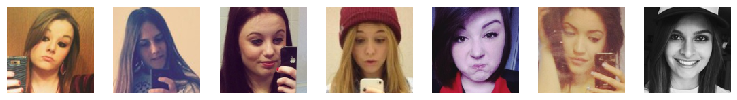

Customized cartoon Version


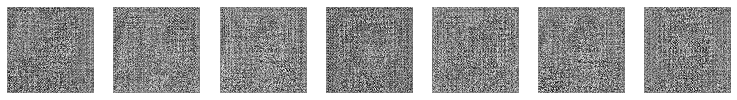

Epoch:0, Step:0, D-Loss:9.887, D-Acc:51.562, G-Loss:2.997
Epoch:0, Step:100, D-Loss:0.463, D-Acc:47.396, G-Loss:2.654
Human Face Images


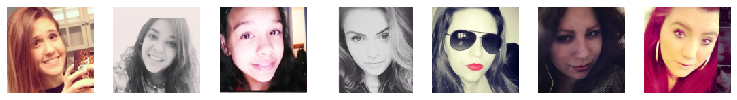

Customized cartoon Version


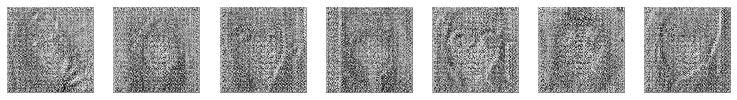

Epoch:0, Step:200, D-Loss:0.301, D-Acc:57.292, G-Loss:1.879
Epoch:0, Step:300, D-Loss:0.293, D-Acc:57.292, G-Loss:2.481
Human Face Images


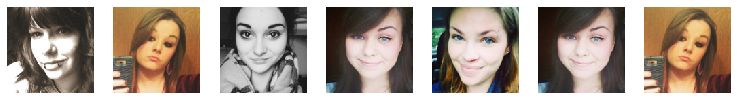

Customized cartoon Version


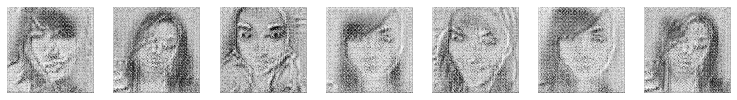

Epoch:0, Step:400, D-Loss:0.242, D-Acc:62.500, G-Loss:2.524
Epoch:0, Step:500, D-Loss:0.330, D-Acc:65.104, G-Loss:2.311
Human Face Images


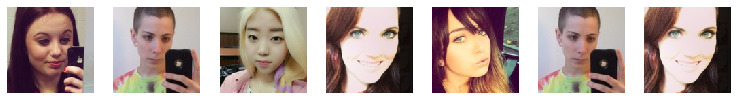

Customized cartoon Version


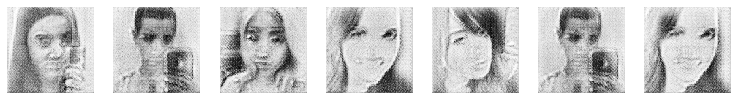

Epoch:0, Step:600, D-Loss:0.270, D-Acc:54.688, G-Loss:1.976
Epoch:0, Step:700, D-Loss:0.241, D-Acc:66.146, G-Loss:1.720
Human Face Images


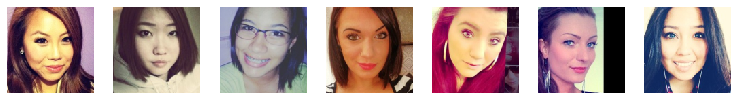

Customized cartoon Version


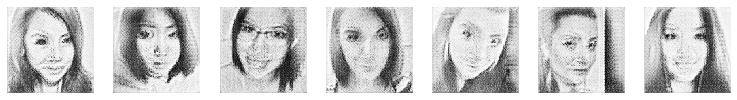

Epoch:0, Step:800, D-Loss:0.315, D-Acc:61.979, G-Loss:1.723
Epoch:0, Step:900, D-Loss:0.387, D-Acc:51.562, G-Loss:2.228
Human Face Images


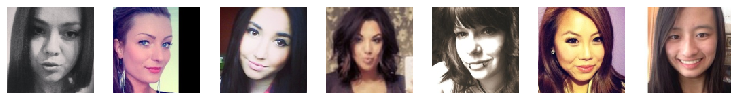

Customized cartoon Version


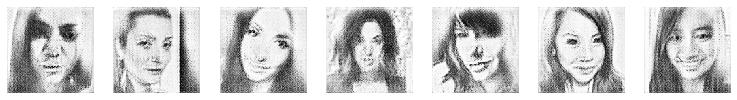

Epoch:0, Step:1000, D-Loss:0.183, D-Acc:76.042, G-Loss:1.947
Epoch:0, Step:1100, D-Loss:0.099, D-Acc:89.062, G-Loss:2.164
Human Face Images


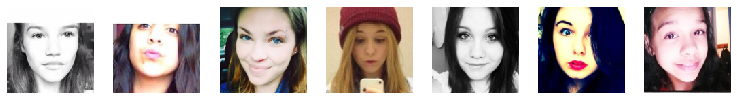

Customized cartoon Version


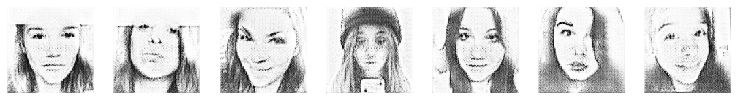

Epoch:0, Step:1200, D-Loss:0.254, D-Acc:69.271, G-Loss:2.257
Epoch:0, Step:1300, D-Loss:0.196, D-Acc:77.604, G-Loss:1.935
Human Face Images


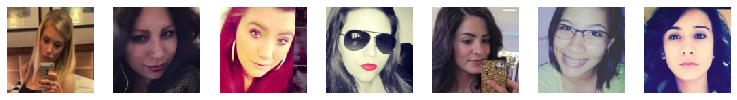

Customized cartoon Version


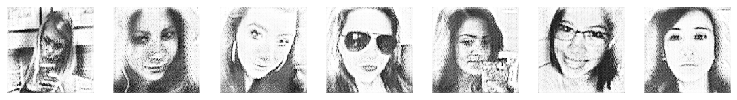

Epoch:0, Step:1400, D-Loss:0.472, D-Acc:42.708, G-Loss:2.220
Epoch:0, Step:1500, D-Loss:0.130, D-Acc:91.146, G-Loss:2.591
Human Face Images


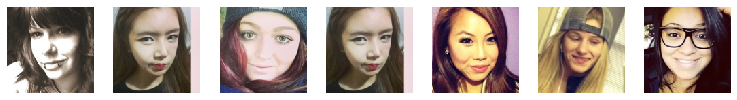

Customized cartoon Version


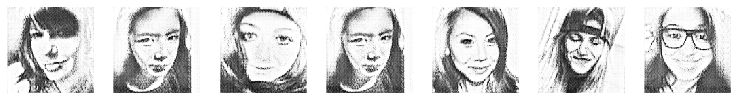

Epoch:0, Step:1600, D-Loss:0.160, D-Acc:82.812, G-Loss:2.389
Epoch:0, Step:1700, D-Loss:0.307, D-Acc:63.021, G-Loss:2.413
Human Face Images


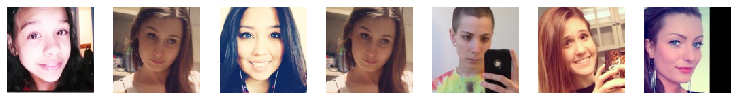

Customized cartoon Version


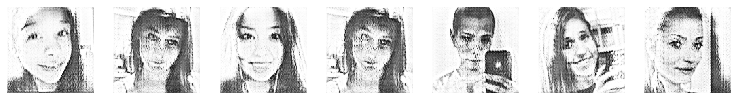

Epoch:0, Step:1800, D-Loss:0.155, D-Acc:82.292, G-Loss:2.649
Epoch:0, Step:1900, D-Loss:0.166, D-Acc:75.521, G-Loss:2.433
Human Face Images


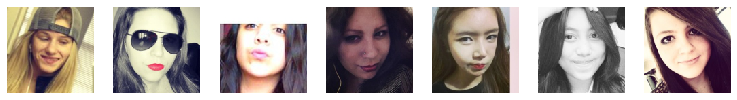

Customized cartoon Version


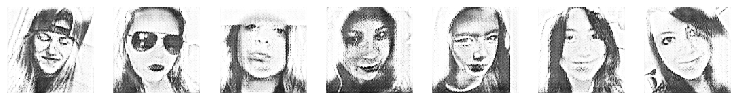

Epoch:0, Step:2000, D-Loss:0.107, D-Acc:86.979, G-Loss:2.360
Epoch:0, Step:2100, D-Loss:0.181, D-Acc:83.333, G-Loss:2.304
Human Face Images


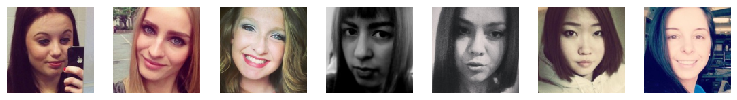

Customized cartoon Version


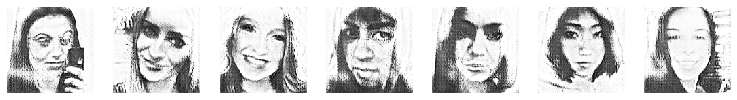

Epoch:0, Step:2200, D-Loss:0.123, D-Acc:86.458, G-Loss:2.629
Epoch:0, Step:2300, D-Loss:0.177, D-Acc:81.771, G-Loss:2.309
Human Face Images


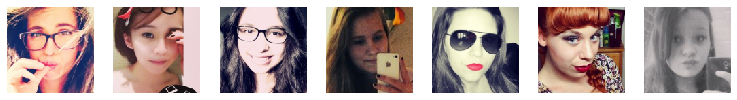

Customized cartoon Version


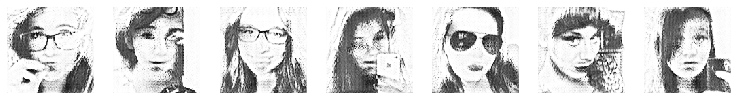

Epoch:0, Step:2400, D-Loss:0.143, D-Acc:82.292, G-Loss:2.150
Epoch:0, Step:2500, D-Loss:0.126, D-Acc:81.250, G-Loss:2.580
Human Face Images


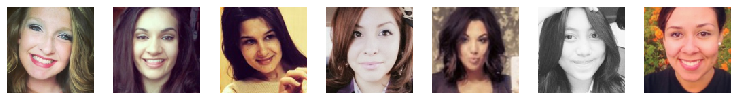

Customized cartoon Version


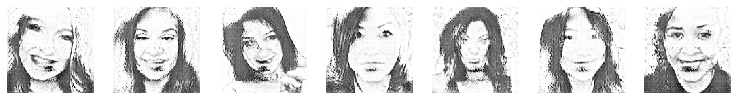

Epoch:0, Step:2600, D-Loss:0.126, D-Acc:81.771, G-Loss:2.404


KeyboardInterrupt: 

In [26]:
epochs = 500
batch_size = 1
steps = 4000

for i in range(0, epochs):
    for j in range(steps): 
        if j%200 == 0:
            show_generator_results(generator_network)
            #generator_network.save("/Users/k15/Downloads/cartoonDataset/weights/mod_" + str(i) + "_" + str(j))

        human_faces, cartoon_faces, smooth_cartoon_faces = get_training_samples(batch_size)

        fake_patch = np.zeros((batch_size, 8, 8, 1))
        real_patch = np.ones((batch_size, 8, 8, 1))
        
        custom_vgg.trainable=False

        styles = custom_vgg(cartoon_faces)
        fake_cartoon_faces = generator_network([human_faces, styles])
        
        # Updating Discriminator weights
        discriminator_network.trainable=True
        loss_d_real = discriminator_network.train_on_batch(cartoon_faces, real_patch)
        loss_d_smooth = discriminator_network.train_on_batch(smooth_cartoon_faces, fake_patch)
        loss_d_fake = discriminator_network.train_on_batch(fake_cartoon_faces, fake_patch)
        
        loss_d = np.add(loss_d_real, np.add(loss_d_smooth, loss_d_fake))/3.0
        
        # Make the Discriminator belive that these are real samples and calculate loss to train the generator
        discriminator_network.trainable=False

        # Updating Generator weights
        loss_g = face2cartoon_gan.train_on_batch([human_faces, styles],[real_patch, human_faces, cartoon_faces])
        
        if j%100 == 0:
            print ("Epoch:%.0f, Step:%.0f, D-Loss:%.3f, D-Acc:%.3f, G-Loss:%.3f"%(i,j,loss_d[0],loss_d[1]*100,loss_g[0]))
            

Human Face Images


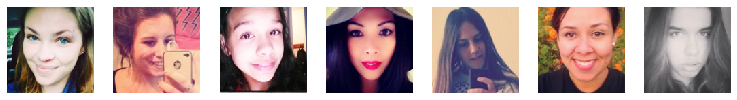

Customized cartoon Version


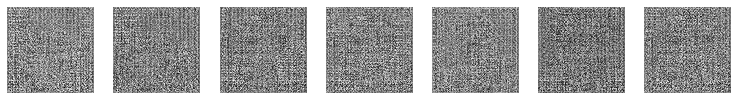

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_0/assets
Epoch:0, Step:0, D-Loss:6.454, D-Acc:49.479, G-Loss:5.188
Human Face Images


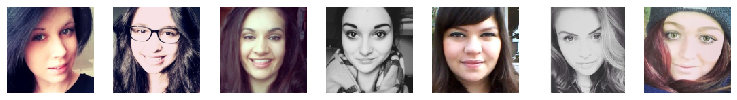

Customized cartoon Version


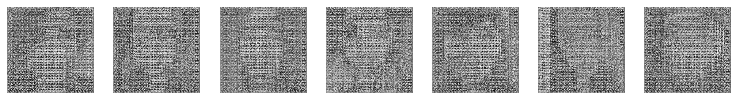

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_100/assets
Epoch:0, Step:100, D-Loss:0.391, D-Acc:50.521, G-Loss:2.291
Human Face Images


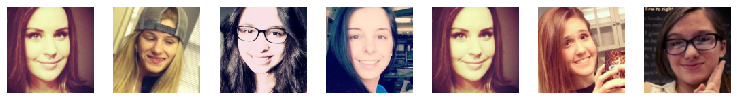

Customized cartoon Version


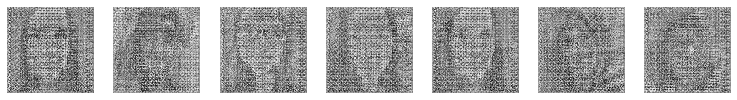

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_200/assets
Epoch:0, Step:200, D-Loss:0.342, D-Acc:58.333, G-Loss:2.392
Human Face Images


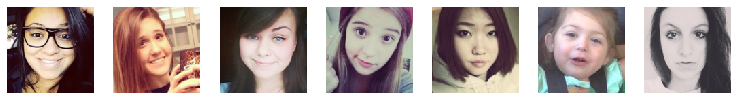

Customized cartoon Version


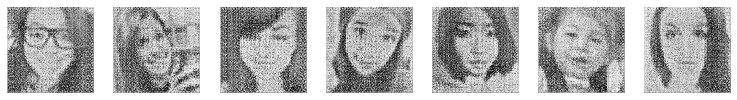

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_300/assets
Epoch:0, Step:300, D-Loss:0.279, D-Acc:59.375, G-Loss:2.329
Human Face Images


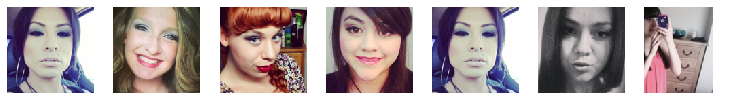

Customized cartoon Version


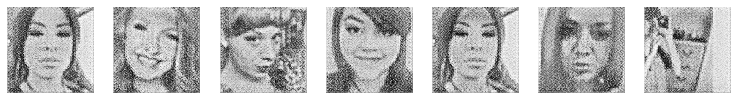

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_400/assets
Epoch:0, Step:400, D-Loss:0.271, D-Acc:61.979, G-Loss:2.062
Human Face Images


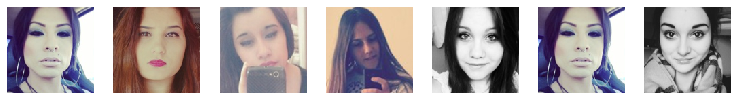

Customized cartoon Version


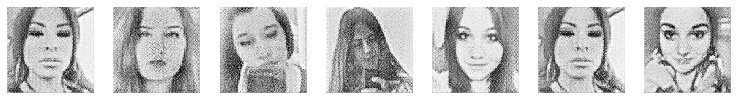

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_500/assets
Epoch:0, Step:500, D-Loss:0.236, D-Acc:61.979, G-Loss:1.864
Human Face Images


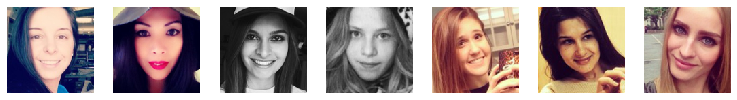

Customized cartoon Version


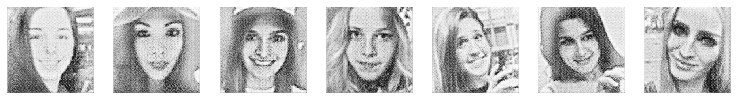

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_600/assets
Epoch:0, Step:600, D-Loss:0.215, D-Acc:65.104, G-Loss:2.036
Human Face Images


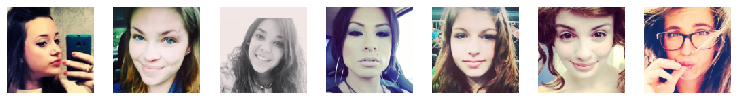

Customized cartoon Version


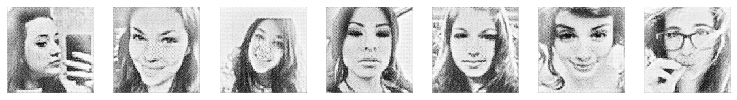

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_700/assets
Epoch:0, Step:700, D-Loss:0.307, D-Acc:57.812, G-Loss:1.840
Human Face Images


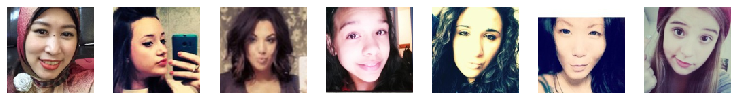

Customized cartoon Version


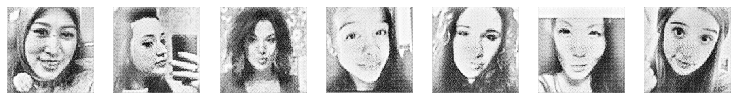

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_800/assets
Epoch:0, Step:800, D-Loss:0.449, D-Acc:53.125, G-Loss:1.950
Human Face Images


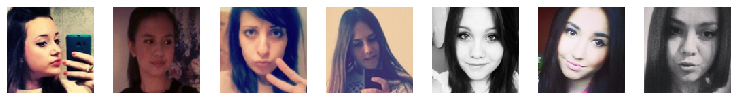

Customized cartoon Version


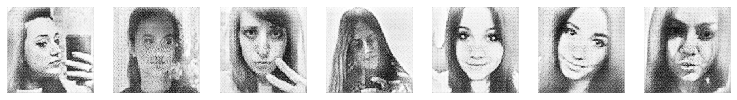

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_900/assets
Epoch:0, Step:900, D-Loss:0.197, D-Acc:73.958, G-Loss:2.078
Human Face Images


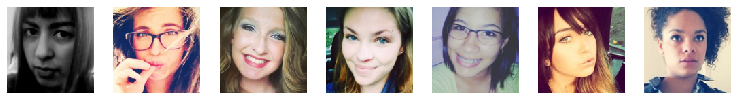

Customized cartoon Version


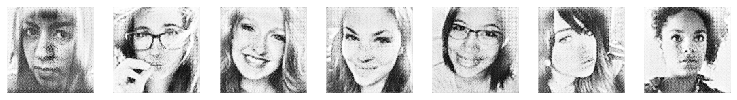

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_1000/assets
Epoch:0, Step:1000, D-Loss:0.419, D-Acc:54.688, G-Loss:2.076
Human Face Images


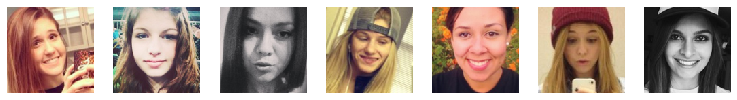

Customized cartoon Version


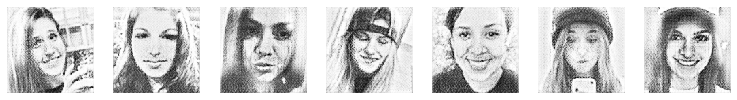

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_1100/assets
Epoch:0, Step:1100, D-Loss:0.243, D-Acc:63.021, G-Loss:2.008
Human Face Images


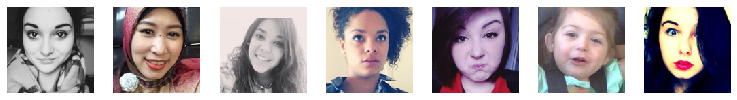

Customized cartoon Version


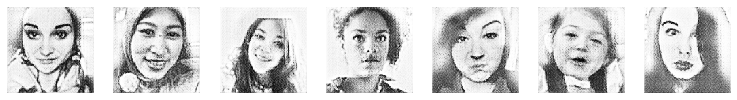

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_1200/assets
Epoch:0, Step:1200, D-Loss:0.211, D-Acc:75.000, G-Loss:2.061
Human Face Images


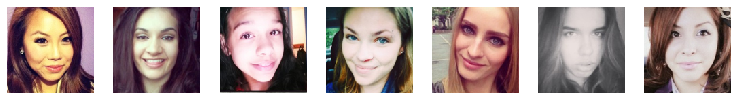

Customized cartoon Version


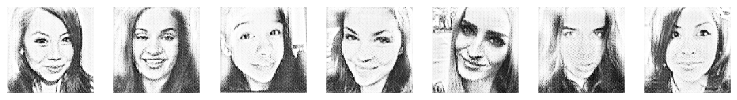

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_1300/assets
Epoch:0, Step:1300, D-Loss:0.128, D-Acc:84.896, G-Loss:1.792
Human Face Images


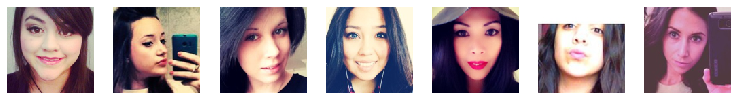

Customized cartoon Version


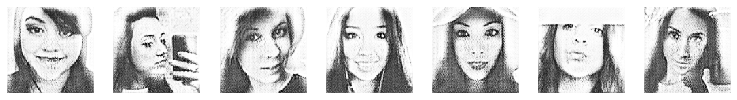

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_1400/assets
Epoch:0, Step:1400, D-Loss:0.099, D-Acc:95.833, G-Loss:2.037
Human Face Images


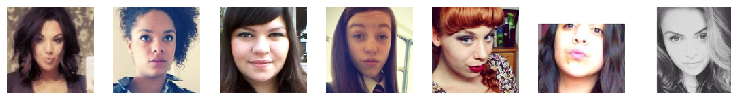

Customized cartoon Version


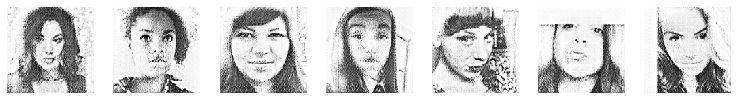

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_1500/assets
Epoch:0, Step:1500, D-Loss:0.079, D-Acc:95.312, G-Loss:2.185
Human Face Images


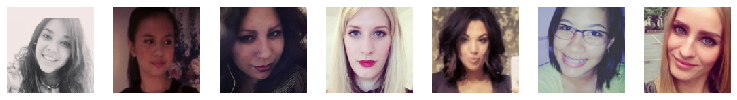

Customized cartoon Version


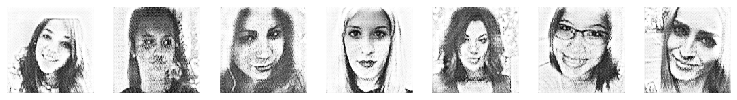

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_1600/assets
Epoch:0, Step:1600, D-Loss:0.207, D-Acc:76.562, G-Loss:1.928
Human Face Images


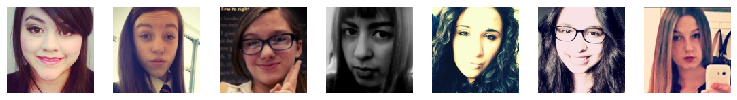

Customized cartoon Version


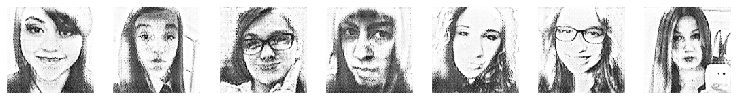

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_1700/assets
Epoch:0, Step:1700, D-Loss:0.180, D-Acc:78.646, G-Loss:2.191
Human Face Images


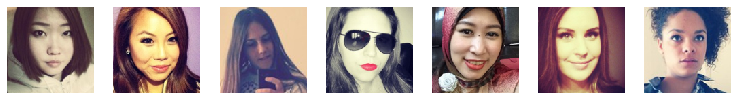

Customized cartoon Version


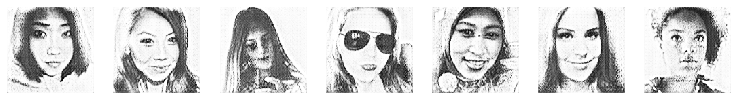

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_1800/assets
Epoch:0, Step:1800, D-Loss:0.160, D-Acc:75.521, G-Loss:2.315
Human Face Images


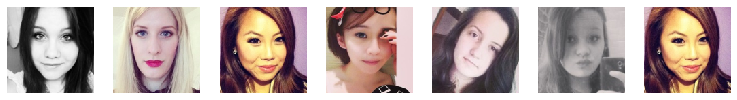

Customized cartoon Version


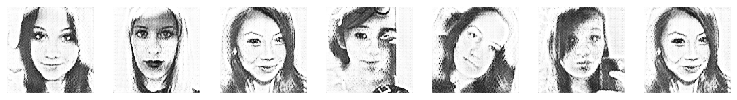

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_1900/assets
Epoch:0, Step:1900, D-Loss:0.190, D-Acc:71.354, G-Loss:2.495
Human Face Images


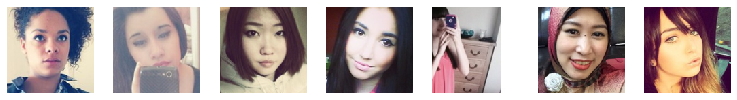

Customized cartoon Version


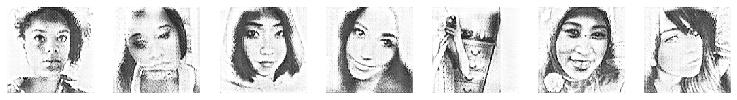

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_2000/assets
Epoch:0, Step:2000, D-Loss:0.105, D-Acc:89.583, G-Loss:2.264
Human Face Images


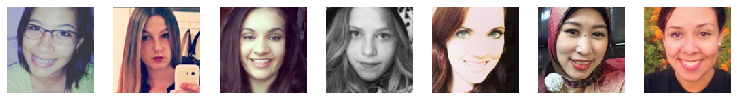

Customized cartoon Version


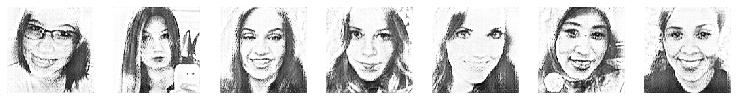

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_2100/assets
Epoch:0, Step:2100, D-Loss:0.091, D-Acc:91.667, G-Loss:2.233
Human Face Images


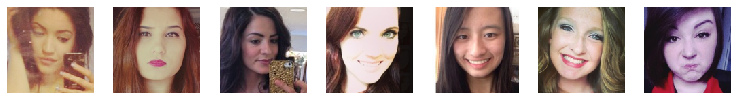

Customized cartoon Version


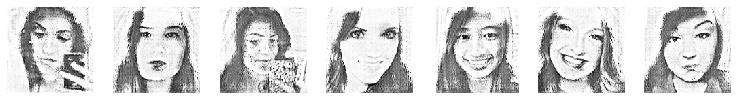

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_2200/assets
Epoch:0, Step:2200, D-Loss:0.132, D-Acc:82.812, G-Loss:2.259
Human Face Images


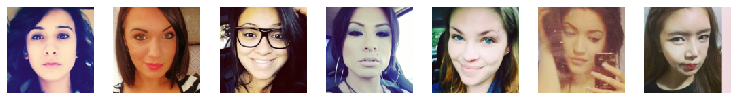

Customized cartoon Version


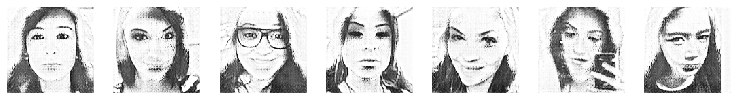

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_2300/assets
Epoch:0, Step:2300, D-Loss:0.139, D-Acc:84.375, G-Loss:2.498
Human Face Images


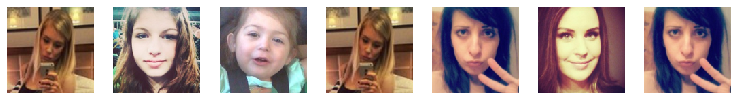

Customized cartoon Version


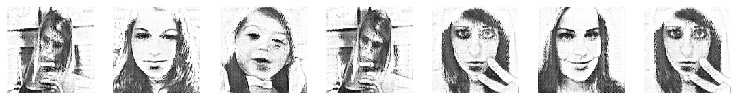

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_2400/assets
Epoch:0, Step:2400, D-Loss:0.124, D-Acc:89.062, G-Loss:2.432
Human Face Images


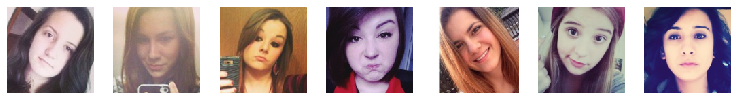

Customized cartoon Version


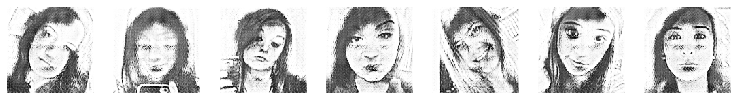

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_2500/assets
Epoch:0, Step:2500, D-Loss:0.146, D-Acc:78.646, G-Loss:2.926
Human Face Images


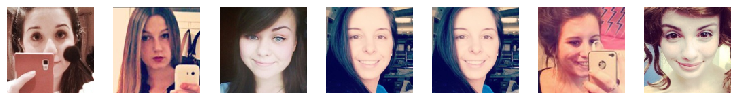

Customized cartoon Version


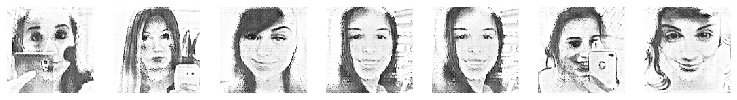

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_2600/assets
Epoch:0, Step:2600, D-Loss:0.122, D-Acc:80.729, G-Loss:2.828
Human Face Images


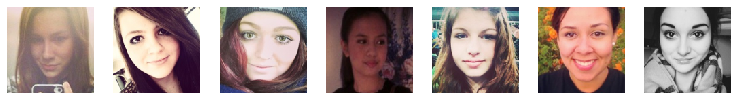

Customized cartoon Version


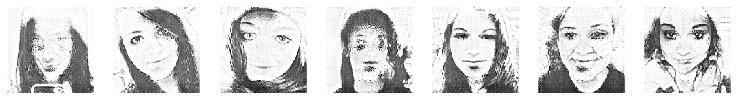

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_2700/assets
Epoch:0, Step:2700, D-Loss:0.133, D-Acc:81.250, G-Loss:2.518
Human Face Images


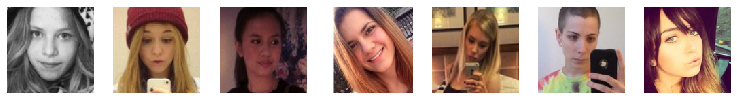

Customized cartoon Version


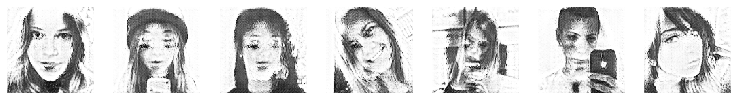

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_2800/assets
Epoch:0, Step:2800, D-Loss:0.046, D-Acc:97.396, G-Loss:2.749
Human Face Images


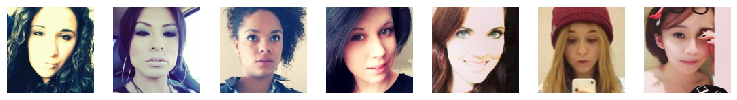

Customized cartoon Version


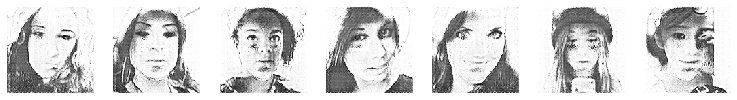

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_2900/assets
Epoch:0, Step:2900, D-Loss:0.236, D-Acc:65.625, G-Loss:2.622
Human Face Images


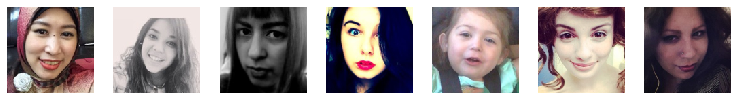

Customized cartoon Version


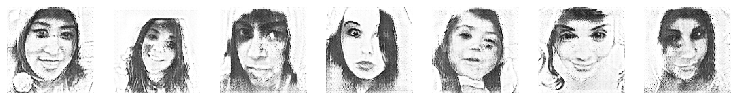

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_3000/assets
Epoch:0, Step:3000, D-Loss:0.290, D-Acc:55.729, G-Loss:2.641
Human Face Images


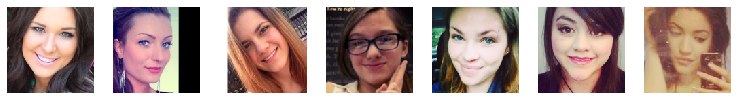

Customized cartoon Version


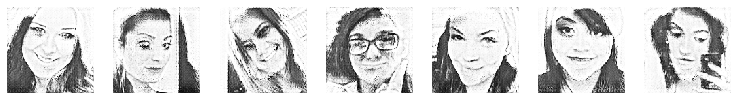

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_3100/assets
Epoch:0, Step:3100, D-Loss:0.064, D-Acc:97.917, G-Loss:2.319
Human Face Images


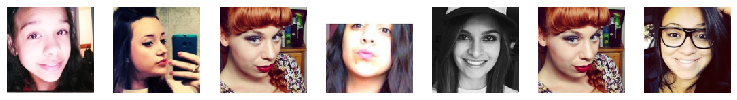

Customized cartoon Version


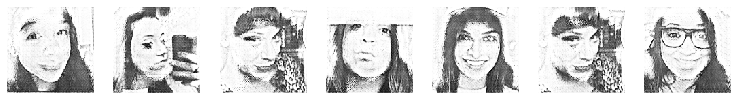

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_3200/assets
Epoch:0, Step:3200, D-Loss:0.084, D-Acc:90.625, G-Loss:2.457
Human Face Images


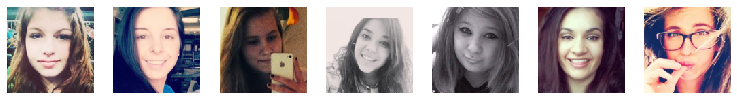

Customized cartoon Version


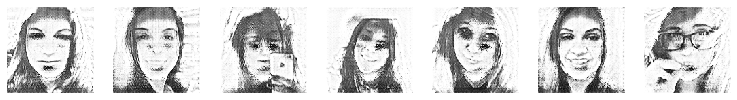

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_3300/assets
Epoch:0, Step:3300, D-Loss:0.047, D-Acc:97.396, G-Loss:2.539
Human Face Images


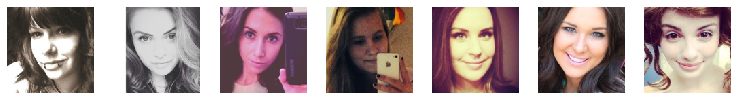

Customized cartoon Version


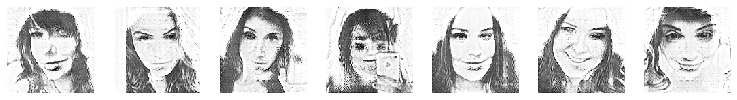

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_3400/assets
Epoch:0, Step:3400, D-Loss:0.174, D-Acc:75.000, G-Loss:2.714
Human Face Images


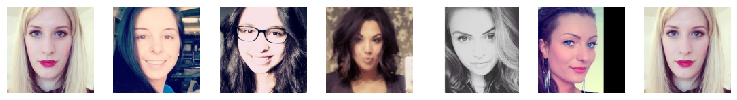

Customized cartoon Version


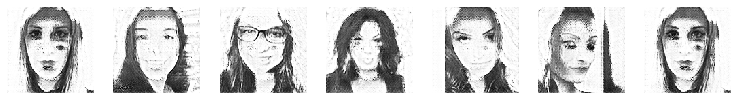

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_3500/assets
Epoch:0, Step:3500, D-Loss:0.096, D-Acc:88.021, G-Loss:2.464
Human Face Images


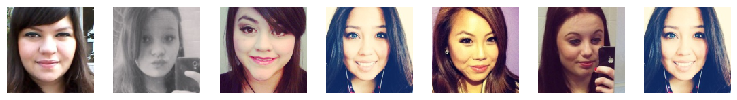

Customized cartoon Version


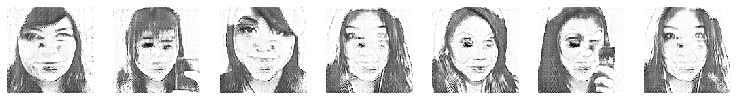

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_3600/assets
Epoch:0, Step:3600, D-Loss:0.078, D-Acc:93.229, G-Loss:2.647
Human Face Images


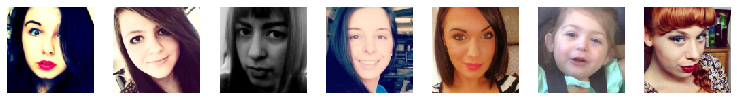

Customized cartoon Version


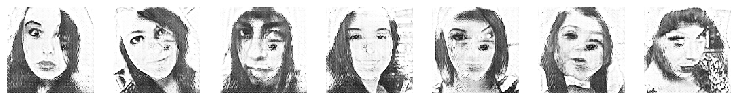

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_3700/assets
Epoch:0, Step:3700, D-Loss:0.048, D-Acc:99.479, G-Loss:2.777
Human Face Images


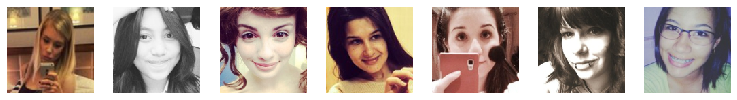

Customized cartoon Version


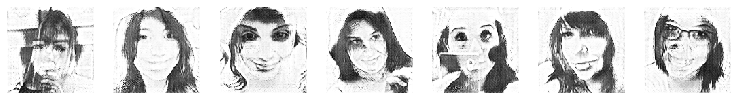

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_3800/assets
Epoch:0, Step:3800, D-Loss:0.046, D-Acc:97.917, G-Loss:2.433
Human Face Images


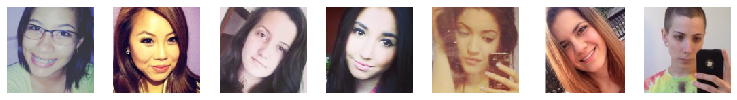

Customized cartoon Version


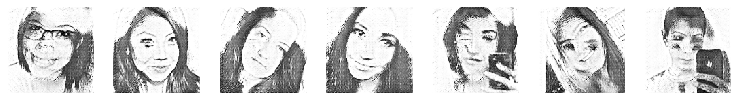

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_0_3900/assets
Epoch:0, Step:3900, D-Loss:0.036, D-Acc:99.479, G-Loss:2.489
Human Face Images


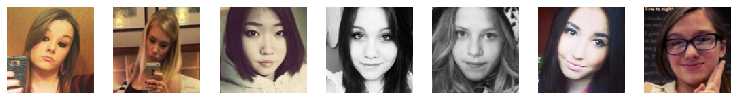

Customized cartoon Version


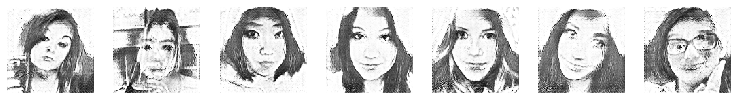

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_0/assets
Epoch:1, Step:0, D-Loss:0.064, D-Acc:95.312, G-Loss:2.711
Human Face Images


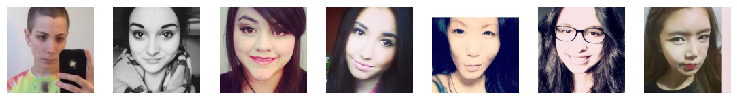

Customized cartoon Version


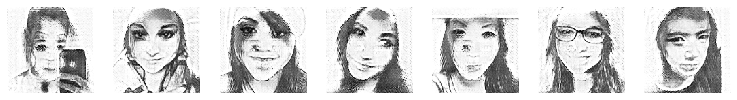

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_100/assets
Epoch:1, Step:100, D-Loss:0.042, D-Acc:98.958, G-Loss:2.717
Human Face Images


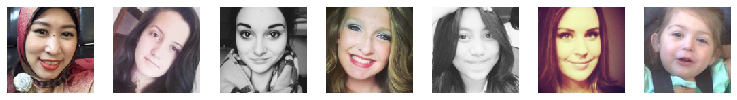

Customized cartoon Version


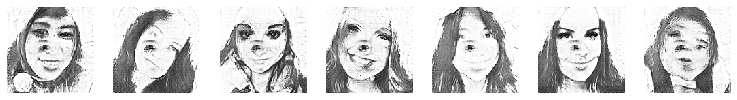

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_200/assets
Epoch:1, Step:200, D-Loss:0.048, D-Acc:96.875, G-Loss:2.597
Human Face Images


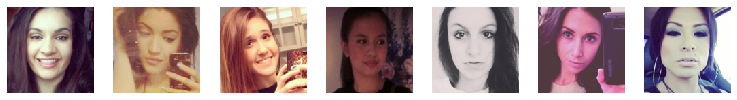

Customized cartoon Version


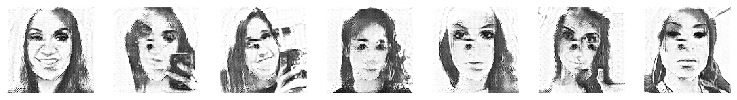

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_300/assets
Epoch:1, Step:300, D-Loss:0.249, D-Acc:67.708, G-Loss:2.535
Human Face Images


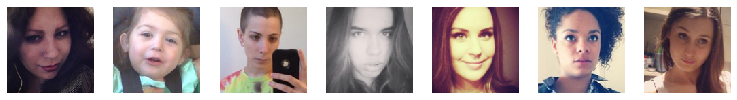

Customized cartoon Version


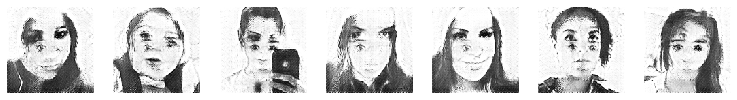

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_400/assets
Epoch:1, Step:400, D-Loss:0.138, D-Acc:81.771, G-Loss:3.051
Human Face Images


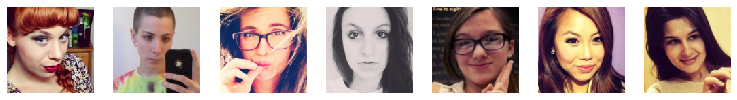

Customized cartoon Version


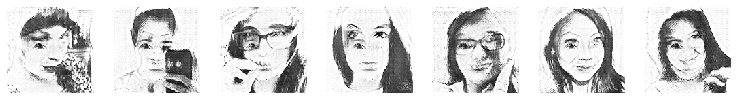

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_500/assets
Epoch:1, Step:500, D-Loss:0.123, D-Acc:88.542, G-Loss:2.684
Human Face Images


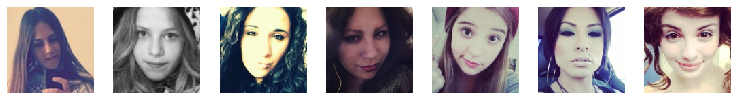

Customized cartoon Version


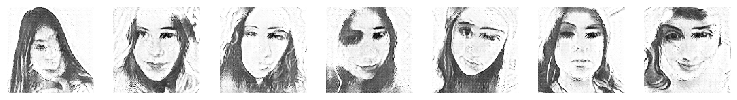

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_600/assets
Epoch:1, Step:600, D-Loss:0.066, D-Acc:95.312, G-Loss:2.637
Human Face Images


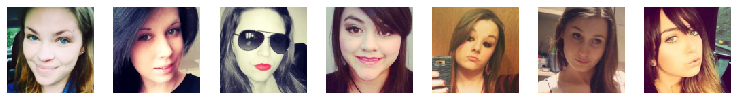

Customized cartoon Version


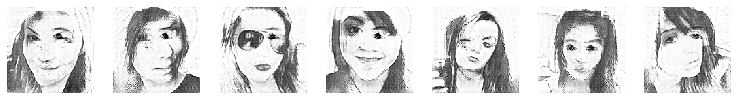

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_700/assets
Epoch:1, Step:700, D-Loss:0.037, D-Acc:100.000, G-Loss:2.559
Human Face Images


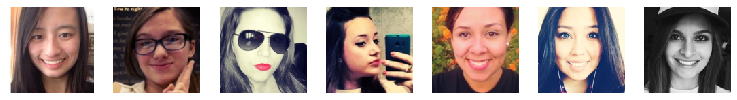

Customized cartoon Version


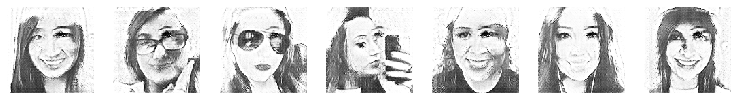

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_800/assets
Epoch:1, Step:800, D-Loss:0.029, D-Acc:100.000, G-Loss:2.584
Human Face Images


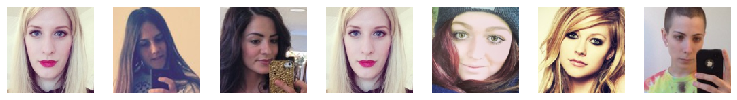

Customized cartoon Version


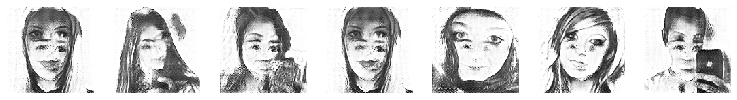

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_900/assets
Epoch:1, Step:900, D-Loss:0.031, D-Acc:100.000, G-Loss:2.867
Human Face Images


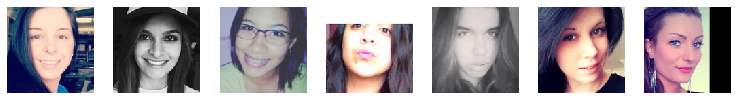

Customized cartoon Version


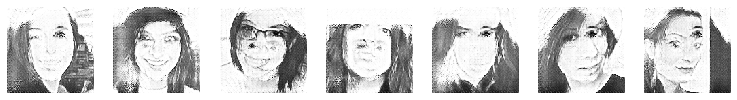

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_1000/assets
Epoch:1, Step:1000, D-Loss:0.039, D-Acc:98.958, G-Loss:2.569
Human Face Images


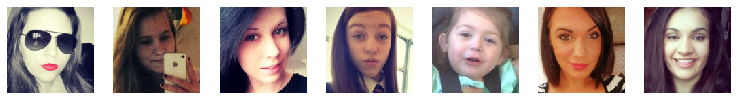

Customized cartoon Version


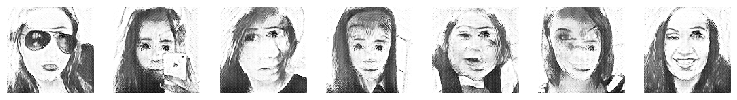

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_1100/assets
Epoch:1, Step:1100, D-Loss:0.028, D-Acc:99.479, G-Loss:2.694
Human Face Images


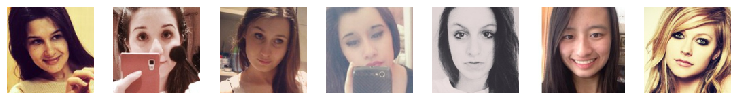

Customized cartoon Version


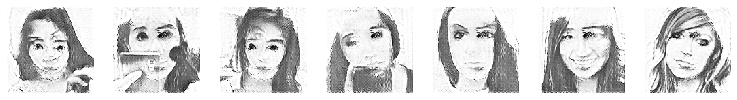

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_1200/assets
Epoch:1, Step:1200, D-Loss:0.042, D-Acc:98.958, G-Loss:2.560
Human Face Images


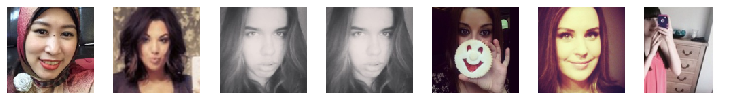

Customized cartoon Version


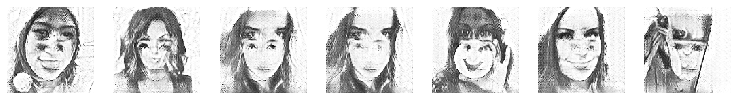

INFO:tensorflow:Assets written to: /Users/k15/Downloads/cartoon/weights/mod_1_1300/assets
Epoch:1, Step:1300, D-Loss:0.028, D-Acc:99.479, G-Loss:2.704


KeyboardInterrupt: 

In [ ]:
epochs = 500
batch_size = 1
steps = 4000

for i in range(0, epochs):
    for j in range(steps): 
        if j%100 == 0:
            show_generator_results(generator_network)
            generator_network.save("/Users/k15/Downloads/cartoon/weights/mod_" + str(i) + "_" + str(j))

        human_faces, cartoon_faces, smooth_cartoon_faces = get_training_samples(batch_size)

        fake_patch = np.zeros((batch_size, 8, 8, 1))
        real_patch = np.ones((batch_size, 8, 8, 1))
        
        custom_vgg.trainable=False

        styles = custom_vgg(cartoon_faces)
        fake_cartoon_faces = generator_network([human_faces, styles])
        
        # Updating Discriminator weights
        discriminator_network.trainable=True
        loss_d_real = discriminator_network.train_on_batch(cartoon_faces, real_patch)
        loss_d_smooth = discriminator_network.train_on_batch(smooth_cartoon_faces, fake_patch)
        loss_d_fake = discriminator_network.train_on_batch(fake_cartoon_faces, fake_patch)
        
        loss_d = np.add(loss_d_real, np.add(loss_d_smooth, loss_d_fake))/3.0
        
        # Make the Discriminator belive that these are real samples and calculate loss to train the generator
        discriminator_network.trainable=False

        # Updating Generator weights
        loss_g = face2cartoon_gan.train_on_batch([human_faces, styles],[real_patch, human_faces, cartoon_faces])
        
        if j%100 == 0:
            print ("Epoch:%.0f, Step:%.0f, D-Loss:%.3f, D-Acc:%.3f, G-Loss:%.3f"%(i,j,loss_d[0],loss_d[1]*100,loss_g[0]))
            